# Hey GIS, Give me a map of the recent natural disasters

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Step-1.-Preparation" data-toc-modified-id="Step-1.-Preparation-1">Step 1. Preparation</a></span></li><li><span><a href="#Step-2.-Understanding-the-data-structure-of-EONET-Feed" data-toc-modified-id="Step-2.-Understanding-the-data-structure-of-EONET-Feed-2">Step 2. Understanding the data structure of EONET Feed</a></span><ul class="toc-item"><li><span><a href="#Make-URLs-clickable" data-toc-modified-id="Make-URLs-clickable-2.1">Make URLs clickable</a></span></li></ul></li><li><span><a href="#Step-3.-Plot-the-features" data-toc-modified-id="Step-3.-Plot-the-features-3">Step 3. Plot the features</a></span></li><li><span><a href="#Step-4.-Creating-the-web-map" data-toc-modified-id="Step-4.-Creating-the-web-map-4">Step 4. Creating the web map</a></span></li><li><span><a href="#Step-5.-Explore-the-data-and-the-maps" data-toc-modified-id="Step-5.-Explore-the-data-and-the-maps-5">Step 5. Explore the data and the maps</a></span></li><li><span><a href="#Step-6.-Statistics-of-natural-disaster-occurrences" data-toc-modified-id="Step-6.-Statistics-of-natural-disaster-occurrences-6">Step 6. Statistics of natural disaster occurrences</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-7">Conclusion</a></span></li></ul></div>

Local, State, National or even foreign governments need support to implement short-term emergency response, and long-term hazard mitigation measures at the occurrence of natural disasters. The sample notebook takes advantage of [NASA's Earth Observatory Natural Event Tracker (EONET) API](https://eonet.sci.gsfc.nasa.gov/eonet-project) to collect a curated and continuously updated set of natural event metadata, and transform them into ArcGIS [FeatureCollection(s)](https://esri.github.io/arcgis-python-api/apidoc/html/arcgis.features.toc.html#featurecollection) and save them into Web Maps in your GIS.

Using the temporal and location information of the event occurrence, this notebook queries the before- and after- disaster satellite images of the prone areas, and adds as overlay layers along with the FeatureCollection generated at the first step. The differences between the two fore and aft images can be used to build a training dataset. Thus when there are sufficient numbers of these images (or labels), you can build a model to predict, from the satellite images, if there was a natural disaster (e.g. tropical cyclone) or not.

With the sample notebook run in a scheduled fashion, you can produce a web map that contains the up-to-date list of natural disasters at any given time. For example, the eruption of Karymsky Volcano in Russia on Feb 15th, 2019 appears as one of the recent events in the `EONET API Feed`, and it would be represented in three forms - as an event vector, a pre-disaster satellite imagery, and a post-disaster satellite image (as shown in Figs 1, 2 and 3), in the resulting web map.

![A Volcano eruption event in Russia](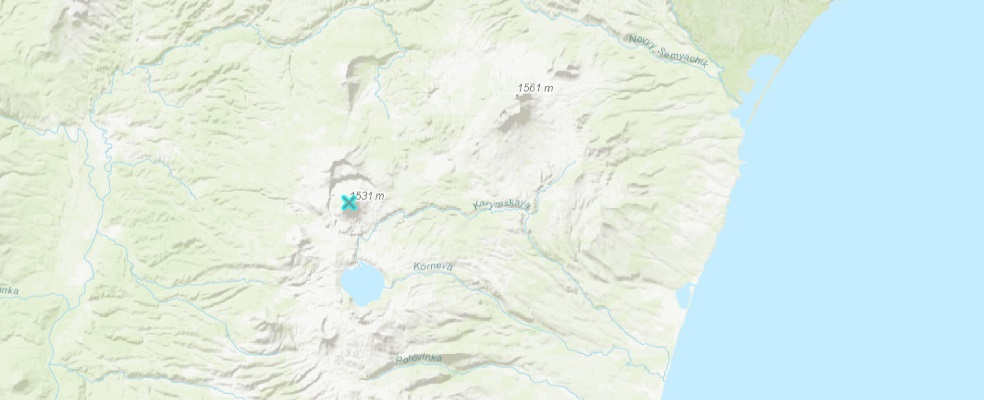 "A Volcano eruption event in Russia")<!-- .element height="50%" width="50%" -->
Fig 1. A Volcano eruption event in Russia

![Satellite Image of the area before the volcano eruption event](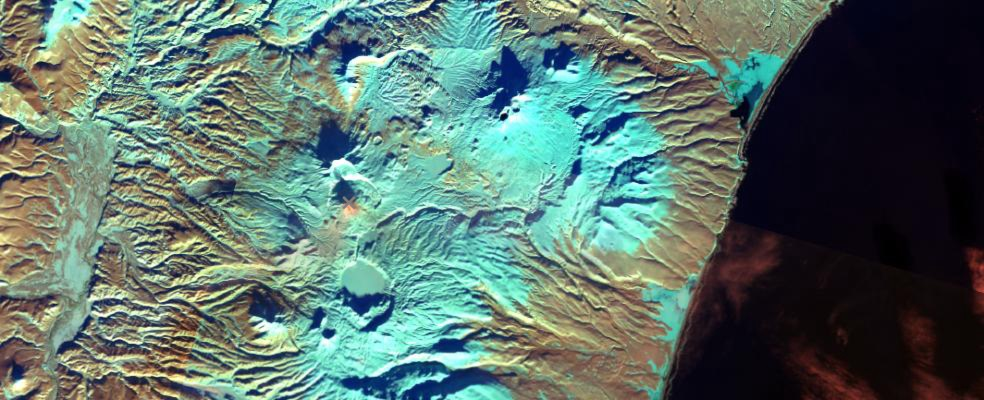 "Before the volcano eruption")
Fig 2. Satellite Image of the area before the volcano eruption event

![Satellite Image of the area after the volcano eruption event](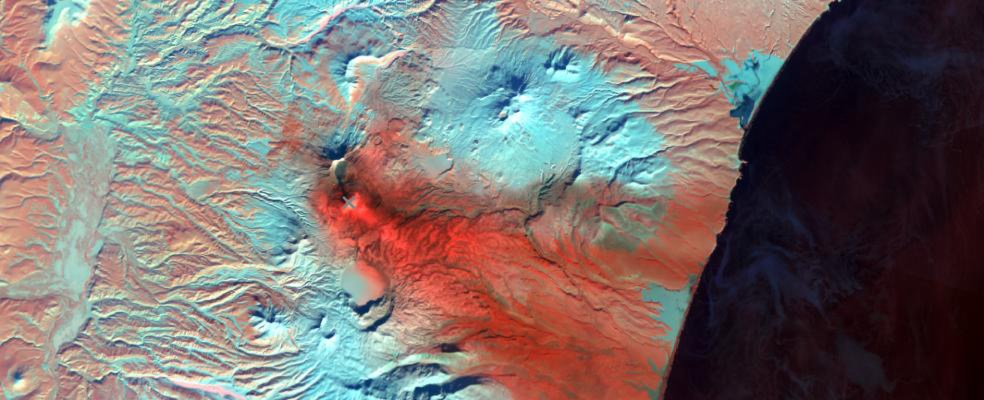 "After the volcano eruption")
Fig 3. Satellite Image of the area after the volcano eruption event

## Step 1. Preparation
In order to access the Land Remote-Sensing Satellite (System) (in short, Landsat) dataset, the first step is to connect to ArcGIS Online organization. The `esri livingatlas` account publishes a series of good-to-use Landsat products in forms of imagery layers ready that you can query, visualize and analyze. You can do so via an existing online profile, or just enter username/password as in `gis = GIS('https://www.arcgis.com',"arcgis_python","P@ssword123")`. 

Create another GIS connection to your ArcGIS Enterprise deployment to save the target web map. Same here, the GIS connection can be created via a profile, or using u/p (`portal_gis = GIS('https://pythonapi.playground.esri.com/portal','arcgis_python','amazing_arcgis_123')`).

In [1]:
from arcgis.gis import GIS

gis = GIS('home', verify_cert = False)

portal_gis = GIS(url='https://pythonapi.playground.esri.com/portal', username='arcgis_python', password='amazing_arcgis_123', verify_cert = False)

The `exact_search` function below extends the generic `search` method and returns you a single match instead of a list. It uses fields such as title, owner and item type, to loop through all the query results and gets an exact match. As seen here, the output of the `exact_search` is a Imagery Layer item titled `"Multispectral Landsat"`.

<Item title:"Multispectral Landsat" type:Imagery Layer owner:esri>
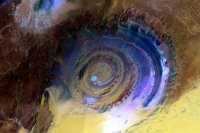

In [2]:
def exact_search(my_gis, title, owner_value, item_type_value):
    final_match = None
    search_result = my_gis.content.search(query= title + ' AND owner:' + owner_value, item_type=item_type_value, outside_org=True)
    
    if "Imagery Layer" in item_type_value:
        item_type_value = item_type_value.replace("Imagery Layer", "Image Service")
    elif "Layer" in item_type_value:
        item_type_value = item_type_value.replace("Layer", "Service")
    
    for result in search_result:
        if result.title == title and result.type == item_type_value :
            final_match = result
            break
    return final_match

landsat_item = exact_search(gis, 'Multispectral Landsat', 'esri', 'Imagery Layer')
landsat = landsat_item.layers[0]
landsat_item

## Step 2. Understanding the data structure of EONET Feed

Carefully studying the geodata feed at [https://eonet.sci.gsfc.nasa.gov/api/v2.1/events](https://eonet.sci.gsfc.nasa.gov/api/v2.1/events), we notice the JSON feed does not strictly follow the GeoJSON standard, which requires a tree structure of `FeatureCollection` > `features` > `Feature` > `geometry`. In order to make the EONET feed easier for parsing, we rewrite the JSON feed to conform to the GeoJSON standard. 

We can then use `from_geojson()` of the ArcGIS API for Python to create a `FeatureSet` object, and eventually a `FeatureCollection` object to save into the Web Map.

In [3]:
import json
from arcgis.geometry import Geometry
import requests
import pandas as pd
from arcgis.features import Feature, FeatureSet, FeatureCollection, GeoAccessor

In [4]:
""" read the response from HTTP request, and load as JSON object;
    all "events" in original JSON will be stored as "features"
"""
response = requests.get("https://eonet.sci.gsfc.nasa.gov/api/v2.1/events")  
obj = json.loads(response.text)
features = obj['events']
obj['features'] = features

Preview the feed data:

In [18]:
from pprint import pprint
print(obj.keys())
print(len(obj['features']), "\n")
pprint(obj['features'][0])

dict_keys(['title', 'description', 'link', 'events', 'features'])
124 

{'categories': [{'id': 8, 'title': 'Wildfires'}],
 'description': '',
 'geometries': [{'coordinates': [34.99872, 31.41316],
                 'date': '2019-05-24T13:41:00Z',
                 'type': 'Point'}],
 'id': 'EONET_4196',
 'link': 'https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4196',
 'sources': [{'id': 'PDC',
              'url': 'http://emops.pdc.org/emops/?hazard_id=92664'}],
 'title': 'Wildfires - Central Israel'}


We have obtained `124` events from the EO feed.

<blockquote> Note: The number of events may vary depending on the time you execute this sample and the number of disasters detected at that time.

Each "event" shall be stored as "Feature", and its geometry will be rewritten here based on its geometry type.

In [20]:
for feature in features:
    
    feature['type'] = "Feature"
    feature['objectIdFieldName'] = feature['id']
    feature["properties"] = {}
    feature["properties"]["id"] = feature["id"]
    feature["properties"]["title"] = feature["title"]
    feature["properties"]["date"] = feature["geometries"][0]['date']
    feature["properties"]["link"] = feature["link"]
    if len(feature["sources"]) > 0:
        feature["properties"]["source_id"] = feature["sources"][0]["id"]
        feature["properties"]["source_url"] = feature["sources"][0]["url"]
    feature["name"] = feature["title"]
    feature['geometry'] = {}
    
    if len(feature["geometries"]) == 1 and feature["geometries"][0]["type"] == "Point":
        feature["geometryType"] = "esriGeometryPoint"
        feature['geometry']['type'] = "Point"
        feature['geometry']['coordinates'] = feature["geometries"][0]['coordinates']
        feature['geometry']['date'] = feature["geometries"][0]['date']
        
    elif len(feature["geometries"]) > 1 and feature["geometries"][0]["type"] == "Point":
        feature["geometryType"] = "esriGeometryPolyline"
        feature['geometry']['type'] = "LineString"
        feature['geometry']['coordinates'] = []
        feature['geometry']['date'] = []
        for g in feature["geometries"]:
            feature['geometry']['date'].append(g['date'])
            feature['geometry']['coordinates'].append(g['coordinates'])
            
    elif len(feature["geometries"]) > 1 and feature["geometries"][0]["type"] == "Point":
        feature["geometryType"] = "esriGeometryMultiPoint" 
        feature['geometry']['type'] = "MultiPoint" 
        feature['geometry']['points'] = []
        feature['geometry']['date'] = []
        for g in feature["geometries"]:
            tmp = {'type': 'Point',
                   'coordinates': None}
            tmp['coordinates'] = g['coordinates']
            feature['geometry']['points'].append(tmp)
            feature['geometry']['date'].append(g['date'])
        
    elif feature["geometries"][0]["type"] == "Polygon":
        feature["geometryType"] = "esriGeometryPolygon"
        feature['geometry']['type'] = "Polygon"
        feature['geometry']['coordinates'] = []
        feature['geometry']['date'] = []
        for g in feature["geometries"]:
            feature['geometry']['coordinates'].append(g['coordinates'][0])
            feature['geometry']['date'].append(g['date'])
    else:
        print(feature)

Next, give the JSON object a root node called `features` and set the type to `FeatureCollection`

In [21]:
obj['features'] = features
obj['type'] = "FeatureCollection"

Now that we standardized the GeoJSON, we can use `from_geojson` method directly to create the `FeatureSet` object, which can be later be used as input as to create a `FeatureCollection` object using the `from_featureset()` method.

In [22]:
fset = FeatureSet.from_geojson(obj)
fc = FeatureCollection.from_featureset(fset, symbol=None, 
                                       name="Natural Disaster Feed Events Feature Collection")
fc.query()

<FeatureSet> 124 features

Read the data as a spatially enabled data frame (SeDF)

In [23]:
df = fc.query().sdf

# Visualize the top 5 records
df.head()

,OBJECTID,SHAPE,date,id,link,source_id,source_url,title
0,1,"{""x"": 34.99872, ""y"": 31.41316, ""spatialReferen...",2019-05-24T13:41:00Z,EONET_4196,https://eonet.sci.gsfc.nasa.gov/api/v2.1/event...,PDC,http://emops.pdc.org/emops/?hazard_id=92664,Wildfires - Central Israel
1,2,"{""x"": -68.7, ""y"": 28.8, ""spatialReference"": {""...",2019-05-21T00:00:00Z,EONET_4192,https://eonet.sci.gsfc.nasa.gov/api/v2.1/event...,NOAA_NHC,https://www.nhc.noaa.gov/archive/2019/ANDREA.s...,Subtropical Storm Andrea
2,3,"{""x"": -120.4293365, ""y"": 58.204834, ""spatialRe...",2019-05-21T00:00:00Z,EONET_4195,https://eonet.sci.gsfc.nasa.gov/api/v2.1/event...,BCWILDFIRE,http://bcfireinfo.for.gov.bc.ca/hprScripts/Wil...,"Fontas River Fire, British Columbia, Canada"
3,4,"{""x"": -114.40635, ""y"": 55.716367, ""spatialRefe...",2019-05-18T14:46:00Z,EONET_4190,https://eonet.sci.gsfc.nasa.gov/api/v2.1/event...,ABFIRE,http://wildfire.alberta.ca/reports/activedd.csv,"Wildfire SWF049-2019 Slave Lake, Alberta, Canada"
4,5,"{""x"": -114.544067, ""y"": 55.655167, ""spatialRef...",2019-05-18T14:46:00Z,EONET_4191,https://eonet.sci.gsfc.nasa.gov/api/v2.1/event...,ABFIRE,http://wildfire.alberta.ca/reports/activedd.csv,"Wildfire SWF050-2019 Slave Lake, Alberta, Canada"


### Make URLs clickable
The columns `link` and `source_url` both contain HTTP URLs. Users will understand the data and source of the feed better if they are made into clickable links. The cells below demonstrate how to display these two columns in clickable hyperlink texts. Further, we split the DataFrame based on the disaster type.

In [5]:
def make_clickable(val):
    return '<a href="{}">{}</a>'.format(val,val)

# query for rows with "Fire" or "Wildfire" in its "title" column
df1 = df[df['title'].str.contains("Fire|Wildfire") == True]
# drop unnecessary columns
cols = [col for col in df.columns if col not in ['OBJECTID', 'SHAPE', 'index']]
df1 = df1[cols]
# attach the two columns with clickable hyperlinks
df1.reset_index().style.format({'link': make_clickable, 'source_url': make_clickable})

,index,date,id,link,source_id,source_url,title
0,0,2019-05-13T15:40:00Z,EONET_4182,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4182,PDC,http://emops.pdc.org/emops/?hazard_id=92189,Wildfires - Southern Switzerland
1,1,2019-05-13T00:00:00Z,EONET_4183,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4183,MBFIRE,http://www.gov.mb.ca/sd/fire/Fire-Statistic/2019/MBFIRE19.txt,"Wildfire MB-CE038, Manitoba, Canada"
2,2,2019-05-13T00:00:00Z,EONET_4184,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4184,MBFIRE,http://www.gov.mb.ca/sd/fire/Fire-Statistic/2019/MBFIRE19.txt,"Wildfire MB-CE039, Manitoba, Canada"
3,3,2019-05-13T00:00:00Z,EONET_4185,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4185,BCWILDFIRE,http://bcfireinfo.for.gov.bc.ca/hprScripts/WildfireNews/OneFire.asp?ID=796,"Richter Creek Fire, British Columbia, Canada"
4,4,2019-05-11T22:18:00Z,EONET_4181,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4181,ABFIRE,http://wildfire.alberta.ca/reports/activedd.csv,"Wildfire PWF052-2019 Peace River, Alberta, Canada"
5,6,2019-05-10T15:47:00Z,EONET_4179,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4179,PDC,http://emops.pdc.org/emops/?hazard_id=92097,Wildfires - Mexico
6,7,2019-05-07T16:27:00Z,EONET_4178,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4178,PDC,http://emops.pdc.org/emops/?hazard_id=91989,Wildfires - Lithuania and Latvia
7,8,2019-05-03T00:00:00Z,EONET_4174,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4174,MBFIRE,http://www.gov.mb.ca/sd/fire/Fire-Statistic/2019/MBFIRE19.txt,"Wildfire MB-CE018, Manitoba, Canada"
8,9,2019-04-30T14:22:00Z,EONET_4170,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4170,PDC,http://emops.pdc.org/emops/?hazard_id=91717,Wildfires - Mexico
9,10,2019-04-30T13:00:00Z,EONET_4173,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4173,InciWeb,http://inciweb.nwcg.gov/incident/6308/,Oregon Lakes Fire


In [6]:
df2 = df[df['title'].str.contains("Cyclone") == True]
df2 = df2[cols]
df2.reset_index().style.format({'link': make_clickable, 'source_url': make_clickable})

,index,date,id,link,source_id,source_url,title
0,5,2019-05-11T00:00:00Z,EONET_4180,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4180,JTWC,http://www.metoc.navy.mil/jtwc/products/sh2719.tcw,Tropical Cyclone Ann


In [7]:
df3 = df[df['title'].str.contains("Volcano") == True]
df3 = df3[cols]
df3.reset_index().style.format({'link': make_clickable, 'source_url': make_clickable})

,index,date,id,link,source_id,source_url,title
0,17,2019-04-16T10:12:29Z,EONET_4160,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4160,SIVolcano,http://volcano.si.edu/volcano.cfm?vn=282110,"Asosan Volcano, Japan"
1,19,2019-04-09T00:00:00Z,EONET_4158,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4158,SIVolcano,http://volcano.si.edu/volcano.cfm?vn=300260,"Klyuchevskoy Volcano, Russia"
2,21,2019-03-26T09:19:10Z,EONET_4156,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4156,SIVolcano,http://volcano.si.edu/volcano.cfm?vn=352090,"Sangay Volcano, Ecuador"
3,25,2019-03-17T00:00:00Z,EONET_4152,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4152,nan,nan,"Villarica Volcano, Chile"
4,67,2019-02-24T10:58:37Z,EONET_4104,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4104,SIVolcano,http://volcano.si.edu/volcano.cfm?vn=263300,"Semeru Volcano, Indonesia"
5,70,2019-02-18T00:00:00Z,EONET_4098,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4098,SIVolcano,http://volcano.si.edu/volcano.cfm?vn=263310,"Tengger Caldera Volcano, Indonesia"
6,71,2019-02-16T00:00:00Z,EONET_4099,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4099,SIVolcano,http://volcano.si.edu/volcano.cfm?vn=300130,"Karymsky Volcano, Russia"
7,72,2019-02-16T00:00:00Z,EONET_4100,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4100,SIVolcano,http://volcano.si.edu/volcano.cfm?vn=233020,"Piton de la Fournaise Volcano, Réunion (France)"
8,76,2019-02-11T09:50:08Z,EONET_4092,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4092,SIVolcano,http://volcano.si.edu/volcano.cfm?vn=345040,"Poas Volcano, Costa Rica"
9,82,2019-01-29T00:00:00Z,EONET_4085,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4085,SIVolcano,http://volcano.si.edu/volcano.cfm?vn=263250,"Merapi Volcano, Indonesia"


In [8]:
df4 = df[df['title'].str.contains("Iceberg") == True]
df4 = df4[cols]
df4.reset_index().style.format({'link': make_clickable, 'source_url': make_clickable})

,index,date,id,link,source_id,source_url,title
0,26,2019-03-13T00:00:00Z,EONET_4129,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4129,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg B38
1,27,2019-03-13T00:00:00Z,EONET_4130,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4130,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg B39
2,28,2019-03-13T00:00:00Z,EONET_4131,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4131,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg B40
3,29,2019-03-13T00:00:00Z,EONET_4132,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4132,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg B45
4,30,2019-03-13T00:00:00Z,EONET_4133,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4133,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg C18B
5,31,2019-03-13T00:00:00Z,EONET_4134,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4134,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg C24
6,32,2019-03-13T00:00:00Z,EONET_4135,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4135,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg C29
7,33,2019-03-13T00:00:00Z,EONET_4136,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4136,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg C30
8,34,2019-03-13T00:00:00Z,EONET_4137,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4137,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg C31
9,35,2019-03-13T00:00:00Z,EONET_4138,https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_4138,NATICE,http://www.natice.noaa.gov/pub/icebergs/Iceberg_Tabular.csv,Iceberg C32


## Step 3. Plot the features

So far, we have transformed and read the EONet feed into a Spatially Enabled DataFrame object. We noticed that features of different disaster types have different geometry types, properties, and data structures. We can use these properties to symbolize these disasters and draw them on a map.

Before plotting on a map, let's take a look at the built-in symbol styles that comes with the `arcgis.mapping` module. Symbol styles come in different sets for Points, Lines and Polygons as shown below.

In [9]:
from arcgis.mapping import show_styles

for idx, style in show_styles('Point').iterrows():
    print(style['ESRI_STYLE'] + " : " + style['MARKER'])
    style_volcano = style['MARKER']
    
print("----")
    
for idx, style in show_styles('Line').iterrows():
    print(style['ESRI_STYLE'] + " : " + style['MARKER'])
    style_cyclone = style['MARKER']
    
print("----")
    
for idx, style in show_styles('Polygon').iterrows():
    print(style['ESRI_STYLE'] + " : " + style['MARKER'])
    style_iceburg = style['MARKER']

Circle (default) : o
Cross : +
Diamond : d
Square : s
X : x
----
Solid (default) : s
Dash : -
Dash Dot : -.
Dash Dot Dot : -..
Dot : .
Long Dash : --
Long Dash Dot : --.
Null : n
Short Dash : s-
Short Dash Dot : s-.
Short Dash Dot Dot : s-..
Short Dot : s.
----
Backward Diagonal : \
Forward Diagonal : /
Vertical Bar : |
Horizontal Bar : -
Diagonal Cross : x
Cross : +
Solid Fill (default) : s


Create a temporary map object.

In [10]:
map_g = portal_gis.map()

The EONet takes liberty in varying the geometry type used to record events of the same type. Thus an Iceburg could be a point or a polygon. The cell below handles this uncertainity. It also picks an appropriate symbol for each geometry type.

The boolean variable `if_Changed`  is used to represent if the geometry of the features inside the FeatureSet has been changed during the parsing or execution process. A hint here: If you are interested to find out the details of each feature stored in the FeatureSet Class object, use `print(ea.get_value('title'), " - ", ea.geometry_type, " - ", ea.geometry)` to display information of each entry.

Also note that, there are three kinds of representations for cyclones - namely, "Cyclone", "Typhoon", and "Tropical Storm". To determine if the disaster is of type cyclones, we need to confirm it falls within one of three categories.

In [11]:
if_Changed = False

# Filter based on disaster type, and each type is assigned a different symbology
for ea in fc.query():
    
    title = ea.get_value('title')
    obj_id = ea.attributes['OBJECTID']
    obj_type = ea.geometry_type
    
    if any(disaster_type in title for disaster_type in ["Cyclone", "Typhoon", "Tropical Storm"]):
        df_sel = df[df['OBJECTID']==obj_id]
        df_sel.spatial.plot(map_widget=map_g,
                            name=title,
                            color='C0',
                            symbol_type = 'simple',
                            symbol_style = style_cyclone)
        
    elif "Volcano" in title:
        if obj_type == 'Point':
            df_sel = df[df['OBJECTID']==obj_id]
            df_sel.spatial.plot(map_widget= map_g,
                                name=title,
                                colors='Reds_r',
                                symbol_type = 'simple',
                                symbol_style = style_volcano)
        else: # Polygon
            if not if_Changed and 'rings' in ea.geometry:
                if isinstance(ea.geometry['rings'], list) and not isinstance(ea.geometry['rings'][0], float):
                    ea.geometry['rings'] = ea.geometry['rings'][0]
                else:
                    ea.geometry['rings'] = ea.attributes['SHAPE']['rings'][0]
                if_Changed = True
            
            df_sel = df[df['OBJECTID']==obj_id]
            df_sel.spatial.plot(map_widget= map_g,
                                name=title,
                                colors='Reds_r',
                                symbol_type = 'simple',
                                symbol_style = style_volcano,
                                outline_style='s',
                                outline_color=[0,0,0,255],
                                line_width=1.0)
            
    elif "Wildfire" in title or "Fire" in title:
        df_sel = df[df['OBJECTID']==obj_id]
        df_sel.spatial.plot(map_widget= map_g,
                            name=title,
                            symbol_color='C1',
                            symbol_type = 'simple',
                            symbol_style = 'd')
        
    elif "Iceberg" in title:
        if obj_type == 'Point':
            df_sel = df[df['OBJECTID']==obj_id]
            df_sel.spatial.plot(map_widget= map_g,
                                name=title,
                                symbol_color='C2',
                                symbol_type = 'simple',
                                symbol_style = style_iceburg)
        else: # Polyline
            df_sel = df[df['OBJECTID']==obj_id]
            df_sel.spatial.plot(map_widget= map_g,
                                name=title,
                                symbol_color='C2',
                                symbol_type = 'simple',
                                symbol_style = style_iceburg)
            
    else:
        print(" - Not recognized - ", title)

MapView(layout=Layout(height='400px', width='100%'))


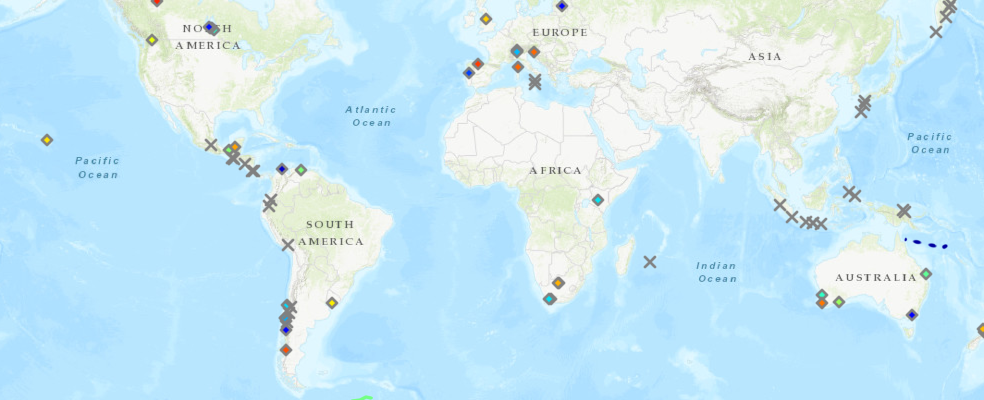

In [12]:
# map_g
map_g1 = gis.map()
for lyr in map_g.layers:
    map_g1.add_layer(lyr)
map_g1

The map view can be saved as a web map item:

In [13]:
web_map_properties = {'title': "Natural Disasters (FC only) Collection",
                      'snippet':'This web map contains multiple FC',
                      'tags':'ArcGIS Python API'}

map_g.save(item_properties=web_map_properties)

<Item title:"Natural Disasters (FC only) Collection" type:Web Map owner:arcgis_python>

In preparation for the next step in which satellite imageries of the same extent and temporal range will be also added to the web map, let's run the cell below to validate that all Feature(s) inside the FeatureCollection object have valid `extent` and `date` properties.

In [14]:
# validation cell
for ea in fc.query():
    if if_Changed and ea.geometry_type == "Polygon":
        if 'rings' in ea.geometry:
                tmp = ea.geometry['rings']
                ea.geometry['rings'] = []
                ea.geometry['rings'].append(tmp)
                if_Changed = False

    if not isinstance(Geometry(ea.geometry).extent, tuple): 
        print("Not able to get geoextent from ", ea.geometry_type, 
              " - ", ea.get_value('title'), " - ", ea.geometry, " - ", ea.get_value('date'))

## Step 4. Creating the web map
This part of the notebook creates the following 3 functions:

 1. parse the metadata feed (in GeoJSON) and create one FeatureClass per event, and add the FeatureClass to a map, 
 2. obtain the temporal range and the spatial boundingbox of the FeatureClass, perform `filter_by(...)` to the landsat imagery layer with the criteria, and add the before- and after- disaster imageries to the map, and
 3. store the current map as web map.

The `filter_images` function defined below accepts a temporal range and a spatial boundingbox of the FeatureCollection.It then calls `filter_by(...)` on the LandSat Imagery Layer, and when one or more mosiac tiles meet the requirements, it gets the `mean` of these tiles and adds it to the current map. It also returns the filter result as a DataFrame.

In [15]:
import arcgis
from arcgis import geometry
from arcgis.geometry import Geometry
import datetime as dt

def filter_images(fc, my_map, start_datetime, end_datetime):
    
    geom_obj = Geometry(fc.geometry)
    selected = landsat.filter_by(where="(Category = 1) AND (CloudCover <=0.2)",
                                 time=[start_datetime, end_datetime],
                                 geometry=geometry.filters.intersects(geom_obj))
    
    if not selected._mosaic_rule.get("lockRasterIds"):
        return None
    else:
        date_title_from = start_datetime.strftime("%m/%d/%Y")
        date_title_to = end_datetime.strftime("%m/%d/%Y")
        extents = Geometry(fc.geometry).extent

        my_map.add_layer(selected.mean(), {"title": date_title_from + "-" + date_title_to + " @ [" + str(extents) + "]"})

        fs = selected.query(out_fields="AcquisitionDate, GroupName, Month, DayOfYear, WRS_Row, WRS_Path")
        tdf = fs.sdf  
        
        return tdf

Next, the cell below will loop through all features in the FeatureCollection, and automatically invoke `filter_images` to get the before- and after- disaster satellite images to the map, when images are available. 

(A hint here, use `print(ea.get_value('title'), " - ", ea.geometry_type, " - ", Geometry(ea.geometry).extent, " - ", ea.get_value('date'))` to get more information of the features being queried.)

In [16]:
%%time

""" Use `fclist_l` to save a reference of which feature has a corresponding raster image before event happens;
    `fclist_r` for the list of features that have corresponding imageries after event happens;
    and `fclist_lr` representing the list of features that have both.
"""
fclist_l = []
fclist_r = []
fclist_lr = []
add_to_map = map_g
gap = 21

for ea in fc.query():
    
    datetime_object = dt.datetime.strptime(ea.get_value('date'), '%Y-%m-%dT%H:%M:%SZ')
    start_datetime = datetime_object - dt.timedelta(days=gap*3)
    end_datetime = datetime_object - dt.timedelta(days=gap)
    tdf1 = filter_images(ea, add_to_map, start_datetime, end_datetime)
    if tdf1 is not None:
        tdf1.head()
        fclist_l.append(ea) 

    start_datetime = datetime_object - dt.timedelta(days=gap)
    end_datetime = datetime_object + dt.timedelta(days=gap)
    tdf2 = filter_images(ea, add_to_map, start_datetime, end_datetime)
    if tdf2 is not None:
        tdf2.head()
        fclist_r.append(ea) 
        if tdf1 is not None:
            fclist_lr.append(ea)                    

Wall time: 1min 38s


We then call the `save` method to save the map view as a web map. This web map contains recent natural disasters as FeatureCollection objects, and their corresponding before- and after-disaster satellite images.

In [17]:
web_map_properties = {'title': "Natural Disasters (FC and Imagery) Collection",
                      'snippet':'This web map contains multiple FC and imageries',
                      'tags':'ArcGIS Python API'}

map_g.save(item_properties=web_map_properties)

<Item title:"Natural Disasters (FC and Imagery) Collection" type:Web Map owner:arcgis_python>

Due to the limitations in the spatial and temporal coverage of lansat dataset, not all of the features created from the natual disaster feed is accompanied with its satellite image. The percentage of features having both before- and post- disaster images is shown as:

In [18]:
print("Out of ", len(fc.query()), " natural disaster events:")
print("# of features with pre- img: ", len(fclist_l))
print("# of features with post- img: ", len(fclist_r))
print("# of features with both img: ", len(fclist_lr))

Out of  127  natural disaster events:
# of features with pre- img:  59
# of features with post- img:  56
# of features with both img:  44


## Step 5. Explore the data and the maps

You can either access the web map item from opening the link, or simply drawing the map in the current map view.

Use `visit_features_on_map_widget` function defined below to explore the places programmatically:

In [19]:
"""# Helper functions to change the extent of a web map 
   # based on point's location, or envelope's bbox
"""
import time
from arcgis.geometry import project


""" Zoom to the center if feature is of Point type, 
    else, zoom to the extents.
"""
def visit_site(m, fc, timesleep, zoom_level=15):
    m.zoom = zoom_level
    
    site = Geometry(fc.geometry).extent
    if fc.geometry_type == 'Point':
        m_center = [site[1], site[0]]
        # print("title: ", fc.get_value('title'), ", center: ", m_center)
        m.center = m_center
    else:
        m_extent = [[site[0], site[1]], [site[2], site[3]]]
        # print("title: ", fc.get_value('title'), ", extent: ", m_extent)
        m.extent = m_extent
    
    time.sleep(timesleep)

    
""" Loop through all features in the map view
"""
def visit_features_on_map_widget(map_obj, fclist_sel, zoom_level=15,  
                                 timesleep=5):
    for ea in fclist_sel:
        visit_site(map_obj, ea, timesleep, zoom_level)

The automaitic map traversal of natural disaster events can be saved as animations, e.g. 

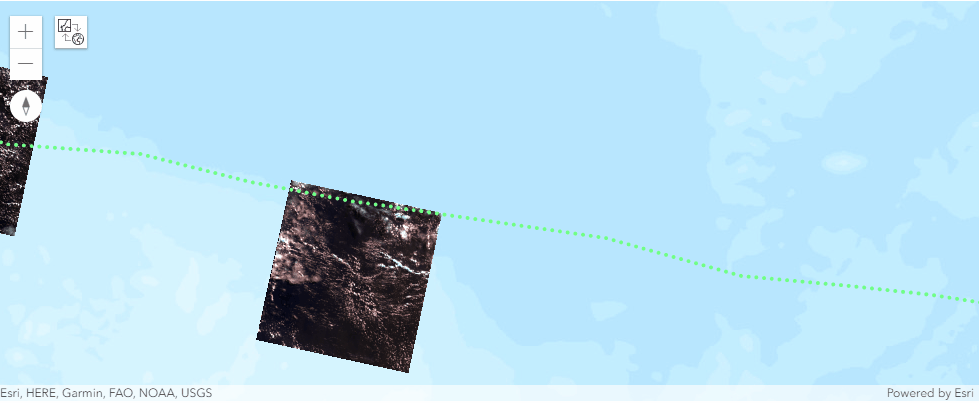

In [22]:
map_h = gis.map()
for lyr in map_g.layers:
    map_h.add_layer(lyr)
map_h

In [21]:
visit_features_on_map_widget(map_h, fclist_lr, zoom_level=5, timesleep=10)

Besides creating a long animation that visits all feature classes in the collection, you can also view an individual event only. For example, the cells below demonstrates a short animation for the Volcano eruption event in Russia:

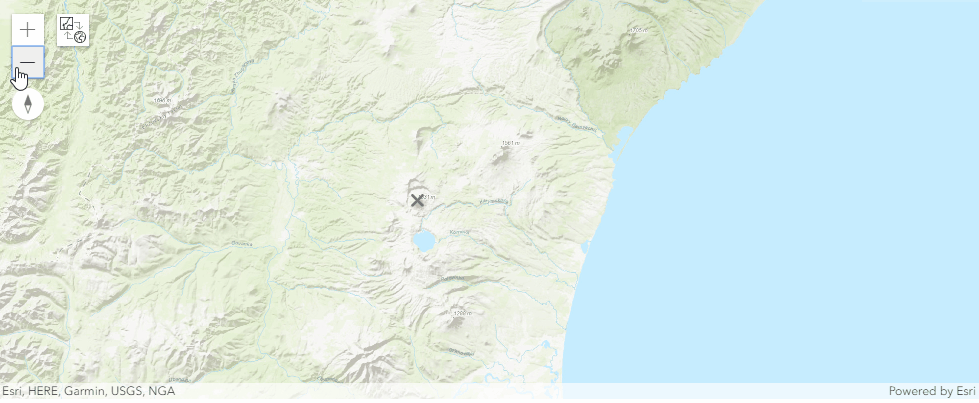

In [28]:
lock_ids = [1022215, 1085347]
map_i = gis.map()

map_i.extent = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100},
 'xmin': 17695788.32155422,
 'ymin': 7149265.133738836,
 'xmax': 17846216.39321951,
 'ymax': 7210414.756367}
map_i.zoom = 10
map_i

In [27]:
for lyr in map_g.layers:
    if 'featureSet' in lyr.properties:
        title = lyr.properties.featureSet.features[0]['attributes']['title']
        if 'Karymsky Volcano, Russia' in title:
            map_i.add_layer(lyr)
            time.sleep(5)
    elif lyr._mosaic_rule.get("lockRasterIds")[0] == lock_ids[0]:
            map_i.add_layer(lyr)
            time.sleep(5)
    elif lyr._mosaic_rule.get("lockRasterIds")[0] == lock_ids[1]:
            map_i.add_layer(lyr)
            time.sleep(5)
            break

Or, if you know the exact location (center or extents) of the event, set the map to display the area manually.

<blockquote> Note: Depending on when you run this notebook, the disasters mentioned below may not be part of your feed. Hence, use the cells below as a hypothetical example.

In [25]:
# Tropical Cyclone Ann
map_h.zoom = 13
map_h.extent = [[146.3, -16.3], [159.5, -13.9]]

In [26]:
# Wildfire, Spain
map_h.zoom = 13
map_h.center = [43.10972, -4.85376]

In [27]:
# Wildfire, Mexico
map_h.center = [17.474261478, -92.414422489]

In [28]:
# Sabancaya Volcano, Peru
map_h.zoom = 12
map_h.center = [-15.779999999986844,  -71.85000000002958]

In [29]:
# Or Aira Volcano, Japan
map_h.zoom = 12.5
map_h.center = [31.592999999761126, 130.6570000002089]

Alternatively, you can either take a screenshot of the current map, or export it to a local HTML file.


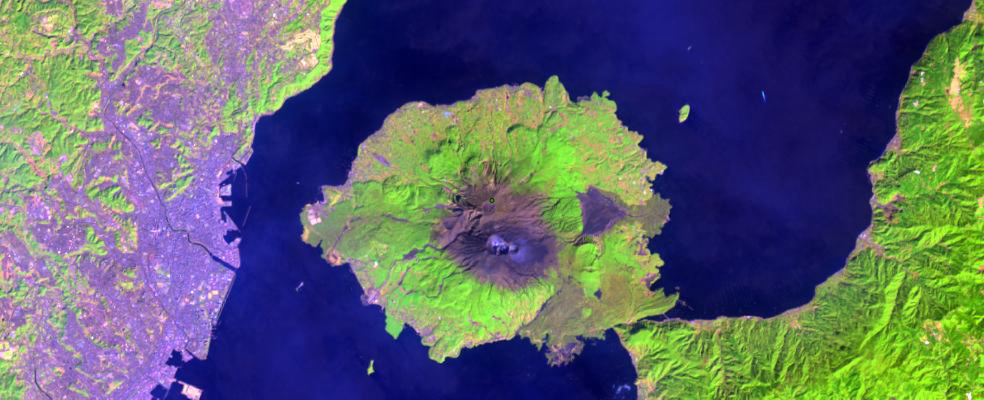

In [33]:
from pathlib import Path

filename = Path('output/screenshots/volcano.png')

map_h.take_screenshot(file_path = str(filename))

## Step 6. Statistics of natural disaster occurrences

Finally, you can loop through the events stored in the web map, count the number of occurrences for each type and produce a bar chart:

In [29]:
def count_features(feature_list):
    counter_c, counter_v, counter_i, counter_w = (0,)*4

    for ea in feature_list:
        title = ea.attributes['title']
        if 'Cyclone' in title:
            counter_c += 1
        elif 'Volcano' in title:
            counter_v += 1
        elif 'Iceberg' in title:
            counter_i += 1
        elif 'Wildfire' in title or 'Fire' in title:
            counter_w += 1
        else:
            pass
    return [counter_c, counter_v, counter_i, counter_w]

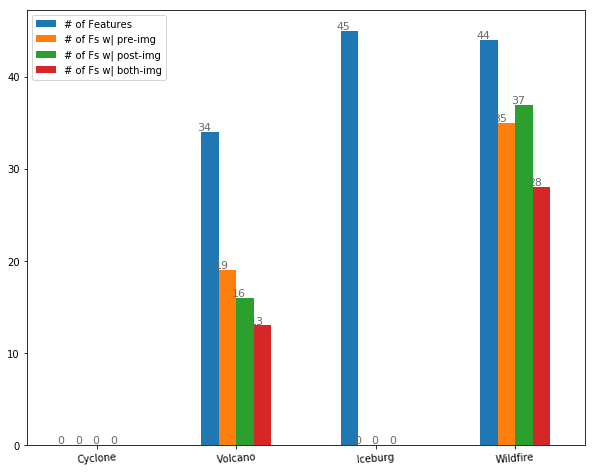

In [67]:
data = [count_features(fc.query()),
        count_features(fclist_l),
        count_features(fclist_r),
        count_features(fclist_lr)]

index = ['Cyclone', 'Volcano', 'Iceburg','Wildfire']
df1 = pd.DataFrame({"# of Features": data[0], \
                   "# of Fs w| pre-img": data[1], \
                   "# of Fs w| post-img": data[2], \
                   "# of Fs w| both-img": data[3]}, index=index)

ax = df1.plot.bar(rot=4, figsize=(10,8))

for i in ax.patches:
    # get_x pulls left or right; get_height pushes up or down
    ax.text(i.get_x()-.03, i.get_height()+.15, \
            str(i.get_height()), fontsize=11,
                color='dimgrey')

## Conclusion

This sample showcases an automated workflow to aggregate the recent ocurrences of natural disasters from NASA's EONET API. It creates FeatureCollections based on the events and adds the before- and post- disaster Landsat satellite images related to the event, and saves all such layers in a web map item on ArcGIS  enterprise. Decision makers or Emergency Response crew members can take advantage of this web map to perform disaster impact analysis or other operations.